In [2]:
import numpy as np
import matplotlib.pyplot as plt
import os
import glob
from scipy.spatial.distance import cdist
import cv2
import sys
import pandas as pd
from IPython.display import display
from datetime import datetime

from astroquery.simbad import Simbad
from astroquery.vizier import Vizier
from photutils.aperture import ApertureStats, aperture_photometry, CircularAperture, CircularAnnulus
from photutils.detection import DAOStarFinder, find_peaks
from astropy.io import fits
from astropy.stats import sigma_clipped_stats
from astropy.table import vstack, Table, Column
from astropy.wcs import WCS
import astropy.units as u
from astropy.coordinates import SkyCoord

sys.path.append('/home/finn/visual_Studio_Code/bachelorarbeit/')
from phot_used_functions import filter_sources, determine_distance, determine_shift, determine_shift_aa, determine_magnitudes, determine_fwhm
from phot_used_functions import import_images
from plotting import show_image

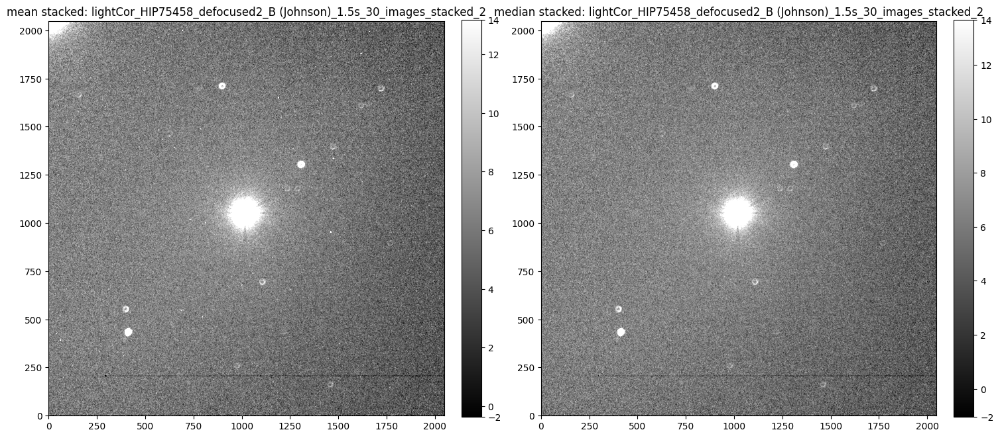

In [49]:
path         ='/home/finn/visual_Studio_Code/data/2023-10-01/stacked/lightCor_HIP75458_defocused2_B (Johnson)_1.5s_30_images_stacked_1.fit'
path_median  ='/home/finn/visual_Studio_Code/data/2023-10-01/stacked_old/lightCor_HIP75458_defocused2_B (Johnson)_1.5s_30_images_stacked_1.fit'

image_list,  header_list, titles, exptime = import_images(path)
image_list_median, header_list_median, titles_median, exptime_median = import_images(path_median)

middle = len(image_list)//2
middle_image = image_list_median[middle]

w = WCS(header_list[middle]) #use mean images wcs because i didnt solved for median yet


fig, ax = plt.subplots(1, 2, figsize=(15, 30))
show_image(image_list[middle], fig=fig, ax=ax[0])
show_image(middle_image , fig=fig, ax=ax[1])
ax[0].set_title(f'mean stacked: {titles[middle]}')
ax[1].set_title(f'median stacked: {titles_median[middle]}')
plt.tight_layout()

# 0. use normal image as reference picture

position of the bright star in focused image [[ 989.12290637 1017.2971473 ]]
detected stars in focused image: 221


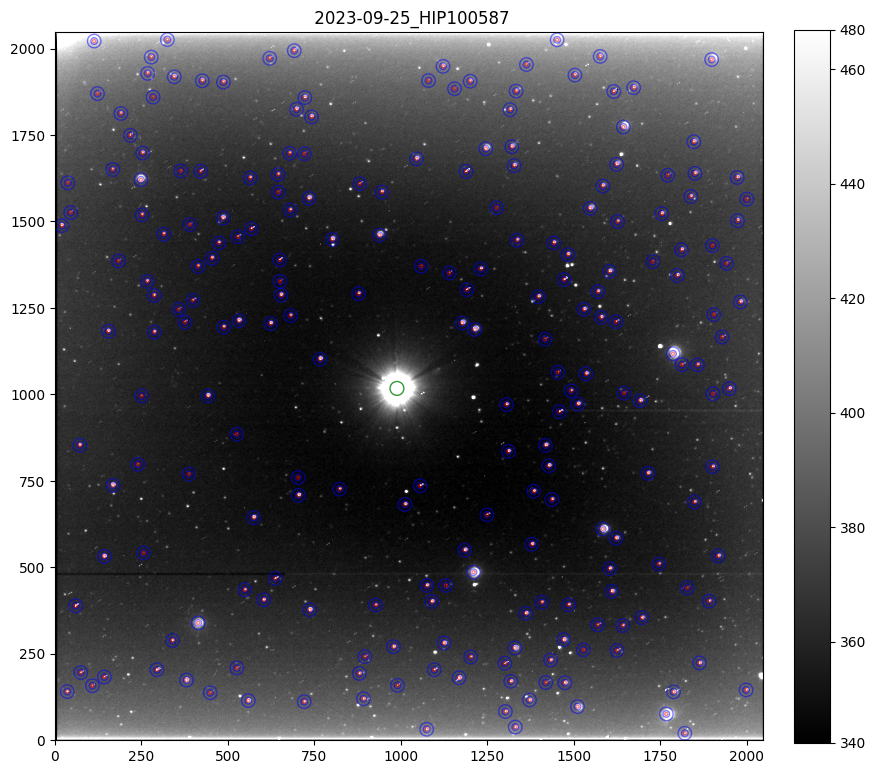

In [63]:
focused_path = "/home/finn/visual_Studio_Code/data/2023-09-25/stacked/lightCor_HIP100587_B (Johnson)_40.0s_10_images_stacked_0.fit"
#focused_path = '/home/finn/visual_Studio_Code/data/2023-09-11/stacked/lightCor_HIP100587_focused_B (Johnson)_40.0s_10_images_stacked_1.fit'
#focused_path = "/content/drive/MyDrive/Bachelor/data/2023-08-23/lightCor/lightCor_R (Johnson)_30.0_0.fit"
#focused_path = "/home/finn/visual_Studio_Code/data/2023-09-11/stacked/lightCor_HIP100587_focused_B (Johnson)_2.0s_10_images_stacked_2.fit"
#focused_path = '/content/drive/MyDrive/Bachelor/data/2023-09-11/lightCor/lightCor_HIP100587_focused_R (Johnson)_1.0s_17.fit'
#focused_path = '/content/drive/MyDrive/Bachelor/data/2023-09-05/stacked/lightCor_HIP75458_H-alpha_40.0s_long_short_10_images_stacked_4.fit'
#focused_path = "/content/drive/MyDrive/Bachelor/data/2023-09-11/stacked/lightCor_HIP100587_focused_B (Johnson)_2.0s_long_short_10_images_stacked_2.fit"
#focused_path = "/content/drive/MyDrive/Bachelor/data/2023-09-11/stacked/lightCor_HIP100587_focused_B (Johnson)_40.0s_long_short_10_images_stacked_0.fit"
radius_bright = 250   # change here (choose larger: is only estimate)!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
center = [1100,1100]  # change here !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!

hdul2 = fits.open(focused_path)
focused_image = hdul2[0].data
fig, ax = plt.subplots(1,1, figsize = (10,10))
show_image(focused_image, fig=fig, ax=ax)
ax.set_title(f" {hdul2[0].header['DATE-OBS'][:10]}_{hdul2[0].header['OBJECT']}")

# for bright star
mask = np.zeros(image_list[0].shape, dtype=bool)
x, y = np.ogrid[:focused_image.shape[1], :image_list[0].shape[0]]
circle_mask = np.sqrt((x - center[0]) ** 2 + (y - center[1]) ** 2) <= (radius_bright)
mask[circle_mask] = True
mask = ~mask

mean, median, std = sigma_clipped_stats(focused_image, sigma=3.0)
daofind_bright = DAOStarFinder(fwhm=10.0, threshold=5.0*std, roundlo=-5.0, roundhi=5.0, brightest=1) #roundlo and roundhi to adjust detection shape. need to be calibrated
sources_bright = daofind_bright(focused_image, mask = mask) #### or image-median? ???????????????????????????
sources_bright.sort(['xcentroid', 'ycentroid'])
position_bright_focused = np.transpose((sources_bright['xcentroid'], sources_bright['ycentroid']))
aperture_bright = CircularAperture(position_bright_focused, r=20)
aperture_bright.plot(color='green', lw=1.0, alpha=0.8);
print("position of the bright star in focused image",position_bright_focused)

# for faint star
mask2 = np.zeros(focused_image.shape, dtype=bool)
circle_mask2 = np.sqrt((x - position_bright_focused[0][0]) ** 2 + (y - position_bright_focused[0][1]) ** 2) <= (radius_bright)
mask2[circle_mask2] = True
daofind_faint = DAOStarFinder(fwhm=3.0, threshold=6.0*std, roundlo=-5.0, roundhi=5.0) #no need to adjust parameters, will do that later
sources_faint = daofind_faint(focused_image, mask=mask2)
sources_faint.sort(['xcentroid', 'ycentroid'])
positions_faint = np.transpose((sources_faint['xcentroid'], sources_faint['ycentroid']))
positions_faint,sources_faint = filter_sources(positions_faint, sources_faint, min_separation=40,  min_edge_distance=20) #exclude multiple detections of star
print('detected stars in focused image:', len(positions_faint))
radius_faint = 4.5 #not relevant for later
apertures_faint = [CircularAperture(position, r=radius_faint) for position in positions_faint]
annulus_apertures_faint = [CircularAnnulus(position,r_in=radius_faint+5, r_out=radius_faint+15) for position in positions_faint]
for aperture in apertures_faint:
    aperture.plot(color="red", lw=1.0, alpha=0.5)
for anulus in annulus_apertures_faint:
    anulus.plot(color="blue", lw=1.0, alpha=0.5)

# 1. For bright Star (method: detect star on every image using starfinder)


In [50]:
shifts = determine_shift(image_list)
print(shifts)

Number of images to process: 5
we use image:  2 from given list as reference image


[(-4.0919404, -5.963428), (-3.145689, -2.8703275), (0, 0), (3.78225, 3.2041175), (6.478239, 6.239638)]


[-16.7920802679946, -16.789325002179325, -16.78622670909295, -16.784374118713753, -16.783043471173702]
0.0032973206795917595
[[[1011.9080595970154, 1045.0365719795227]], [[1012.8543109893799, 1048.1296725273132]], [[1016, 1051]], [[1019.7822499275208, 1054.2041175365448]], [[1022.4782390594482, 1057.239637851715]]]
[-16.780132674999333, -16.778185016995216, -16.77329557073316, -16.774437365343115, -16.770040530961477]
0.003579623732424686
[[[1011.9080595970154, 1045.0365719795227]], [[1012.8543109893799, 1048.1296725273132]], [[1016, 1051]], [[1019.7822499275208, 1054.2041175365448]], [[1022.4782390594482, 1057.239637851715]]]


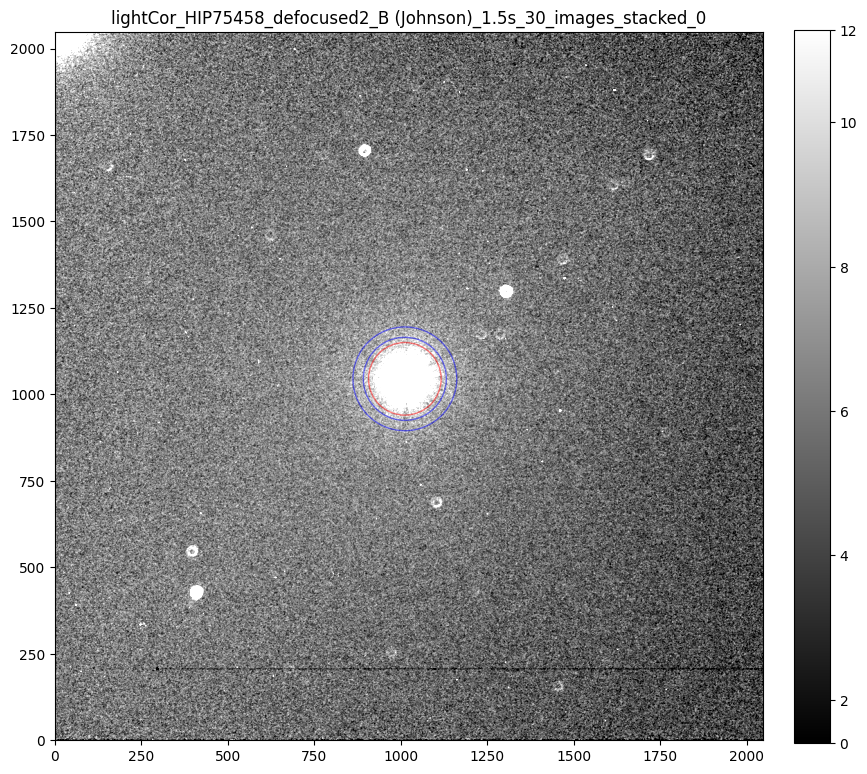

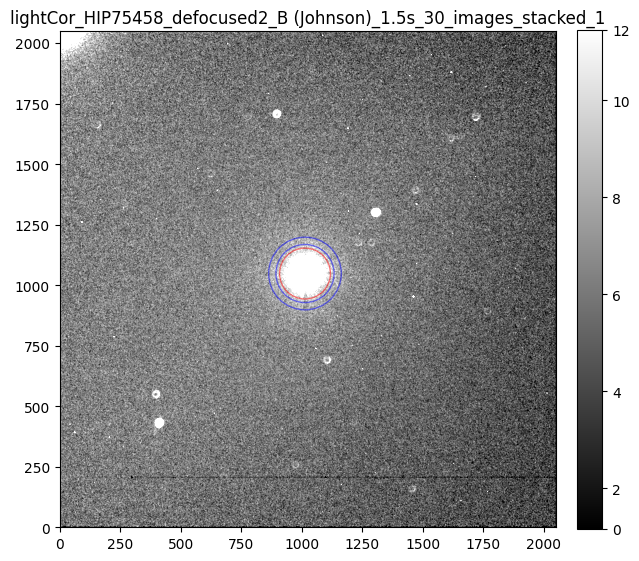

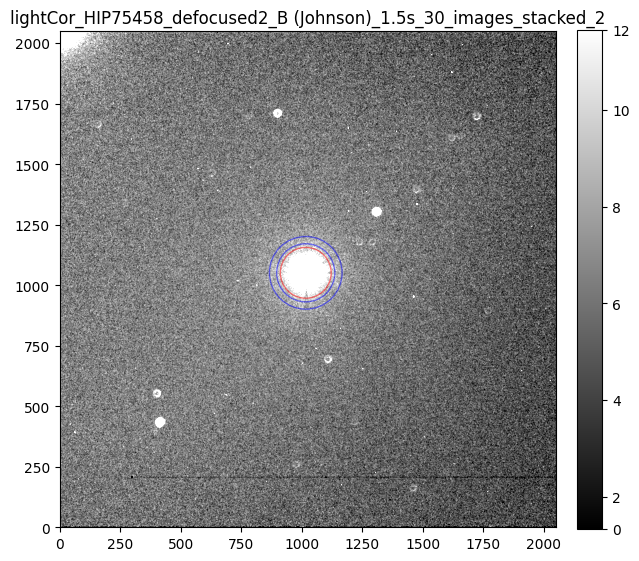

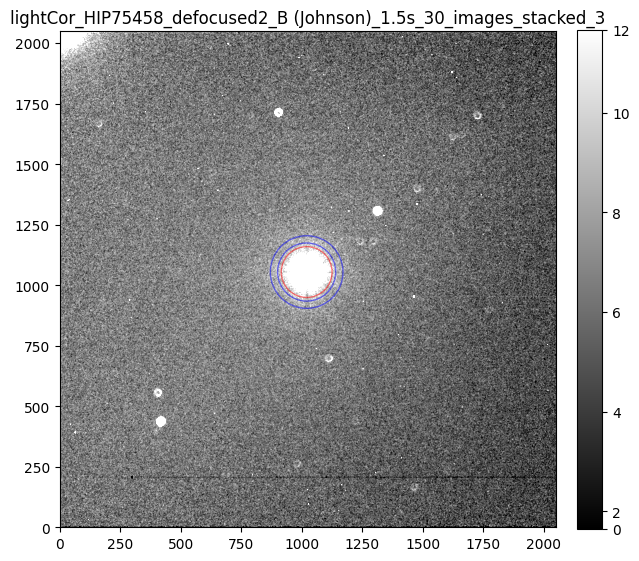

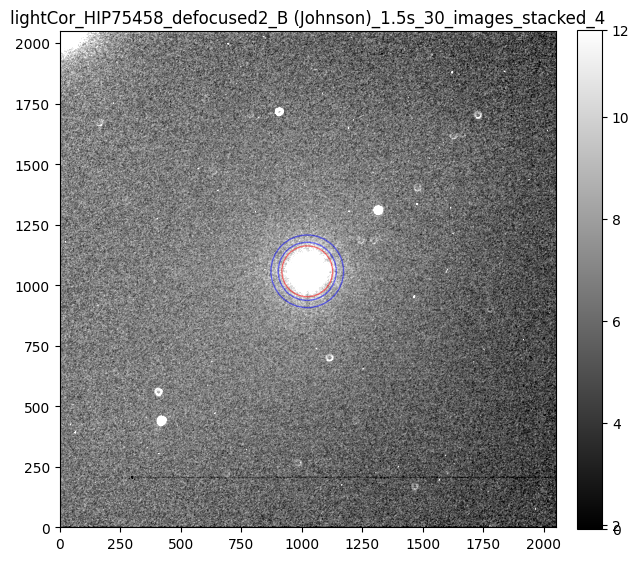

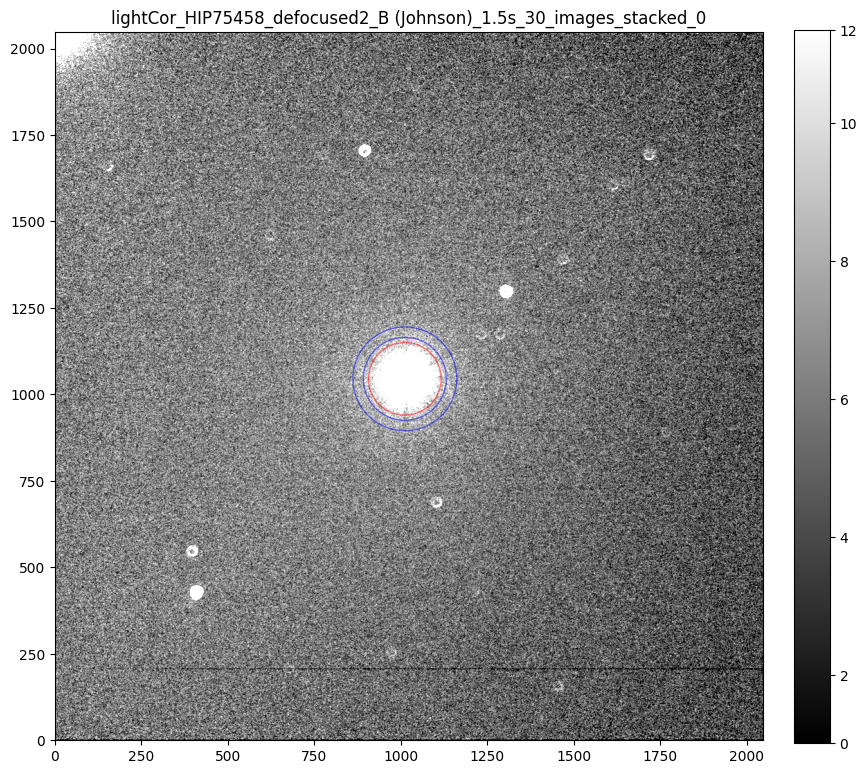

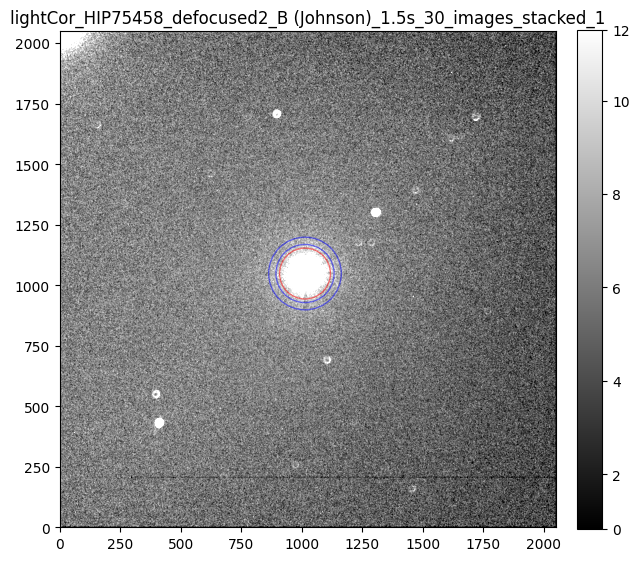

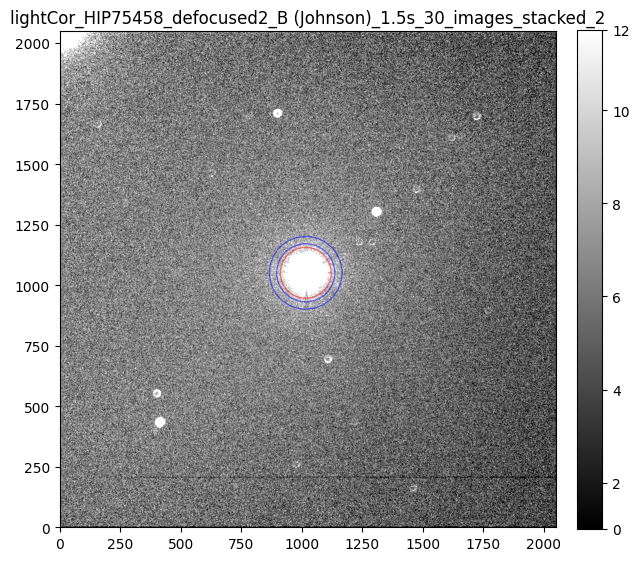

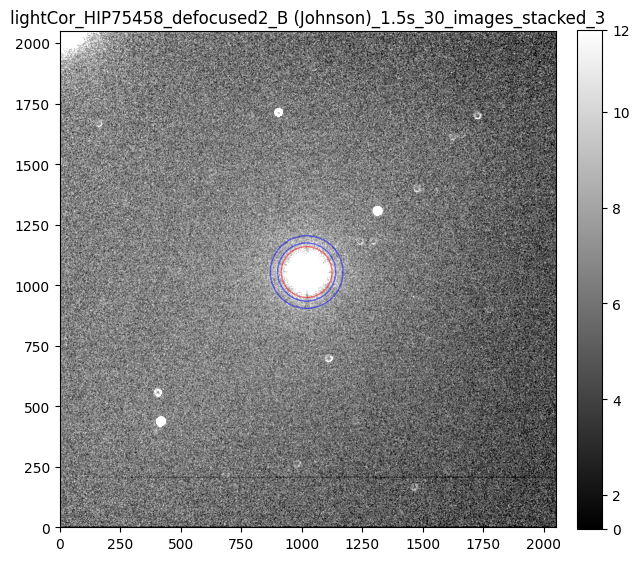

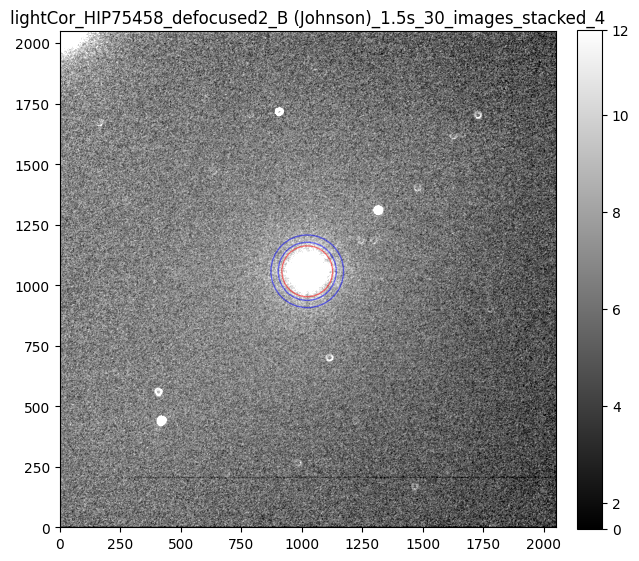

In [51]:
radius_bright = 105 ############## change here 
def get_mag_bright(image_list, apperture_radius=60): #default value of the apperture radius is 60 but need to be changed below
    positions_bright, magnitude_list_bright = [], []
    middle_image = image_list[len(image_list)//2]
    mean, median, std = sigma_clipped_stats(middle_image, sigma=3.0)
    daofind = DAOStarFinder(fwhm=5.0, threshold=5.0*std, roundlo=-5.0, roundhi=5.0,brightest=1) #roundlo and roundhi to adjust detection shape. need to be
    sources = daofind(middle_image)
    #positions = np.transpose((sources['xcentroid'], sources['ycentroid']))
    positions =  [(1016, 1051)] # if pos from clicker. if pos from ref image change here !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!

    for i, image in enumerate(image_list):
        shifted_position = [[positions[0][0]+shifts[i][0], positions[0][1]+shifts[i][1]]]   #the two [] just to match function     
        if i == 0:
            fig, ax = plt.subplots(1,1, figsize=(10,10))
        else: 
            fig, ax = plt.subplots(1,1, figsize=(7,7))
        show_image(image, fig=fig, ax=ax)
        ax.set_title(titles[i])
        magnitudes = determine_magnitudes(image, positions=shifted_position, star_radius=apperture_radius, exptime=exptime)
        magnitude_list_bright.append(magnitudes)
        positions_bright.append(shifted_position)
    print(magnitude_list_bright)
    print(np.std(magnitude_list_bright))
    print(positions_bright)
    return positions_bright, magnitude_list_bright

pos_br_mean, mag_br_mean = get_mag_bright(image_list, apperture_radius=radius_bright)
pos_br_median, mag_br_median = get_mag_bright(image_list_median, apperture_radius=radius_bright)

# 2. Background stars

In [76]:
#alternative way of determine shifts using dist. from bright stars of images
shifts_ft = []
for position in pos_br_median:
    shift = (position[0][0]-position_bright_focused[0][0], position[0][1]-position_bright_focused[0][1])
    shifts_ft.append(shift)

print(shifts_ft)

[(-0.7597455663461687, -80.32092823261019), (1.2036457376699445, -81.18199027502533), (4.808012993834495, -81.20957239890095), (6.874097378752708, -81.08425218039747), (10.42632964422512, -81.09897931092974), (14.948994191191673, -81.5145553218722), (27.66372206976223, -80.50245686048265), (36.08493712713528, -81.20351942056413)]


In [79]:
# will not work for most cases
shifts_ft = determine_shift(image_list, focused_image)
print(shifts_ft)

Number of images to process: 8
[(5.66445, -77.59488), (7.206126, -78.0832), (11.139218, -78.50253), (13.247402, -78.52455), (16.66093, -78.464066), (21.273838, -78.80783), (34.347763, -78.321175), (42.477055, -78.81324)]


In [80]:
### extra shift just for this case remove later !!!!!!!!!!!!!!!
shifts_ft = [(s[0]+3, s[1]+3) for s in shifts_ft]
print(shifts_ft)

[(8.66445016860962, -74.59487915039062), (10.20612621307373, -75.08319854736328), (14.1392183303833, -75.50253295898438), (16.24740219116211, -75.52455139160156), (19.660930633544922, -75.46406555175781), (24.27383804321289, -75.80783081054688), (37.34776306152344, -75.32117462158203), (45.477054595947266, -75.81324005126953)]


6


[-9.630039540531627, -9.630083124084436, -9.594327737015723, -9.642044636497152, -9.624830705646191]
0.01599919434184994
[-9.61080778172314, -9.628991941903577, -9.622394447933235, -9.632340149958189, -9.627399560658356]
0.007508648858649363


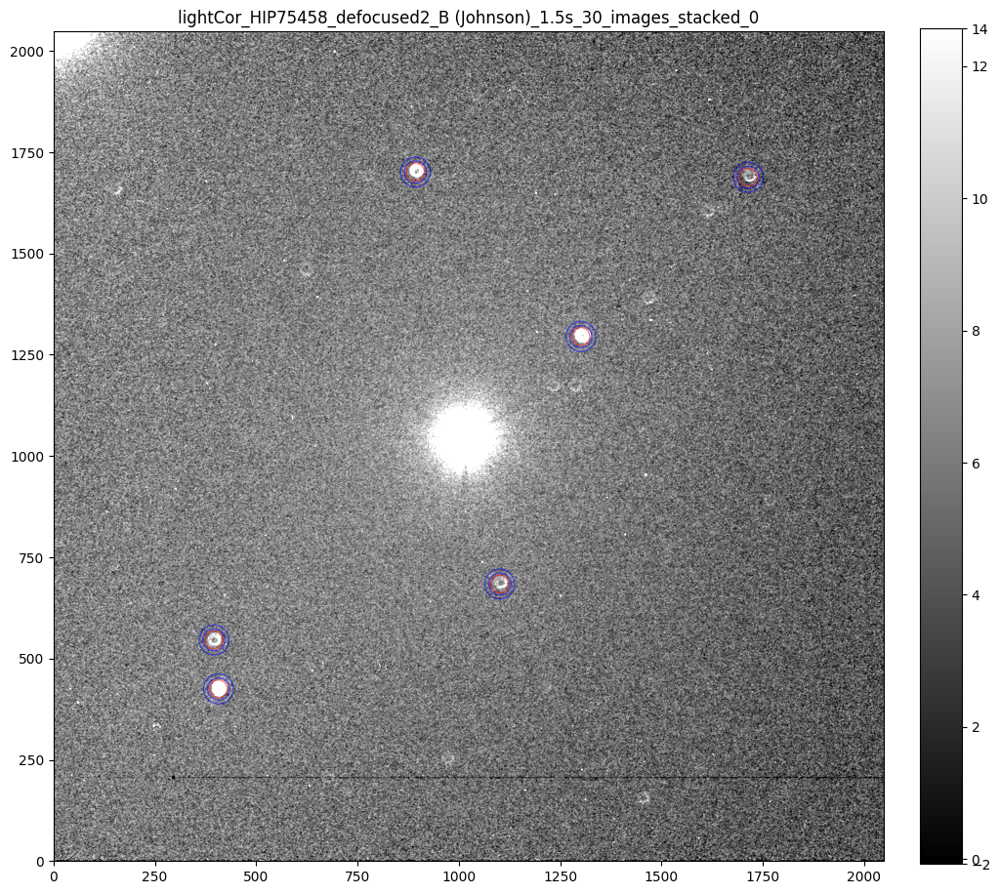

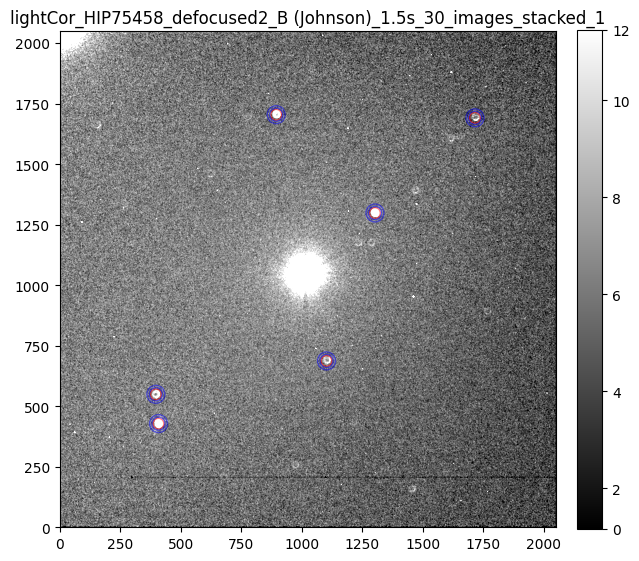

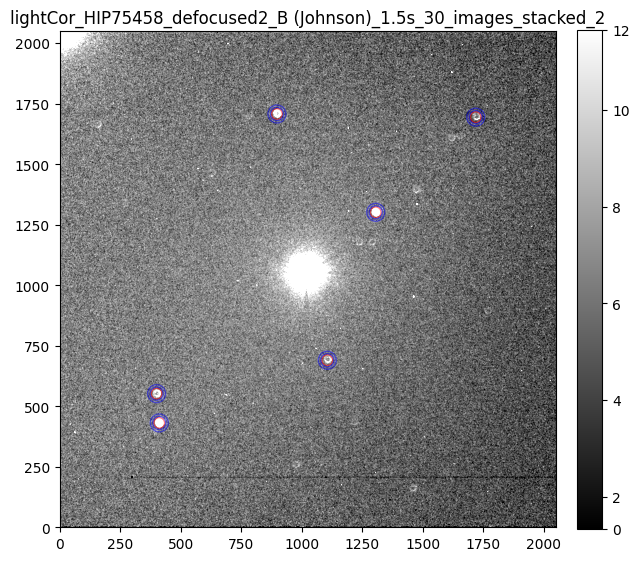

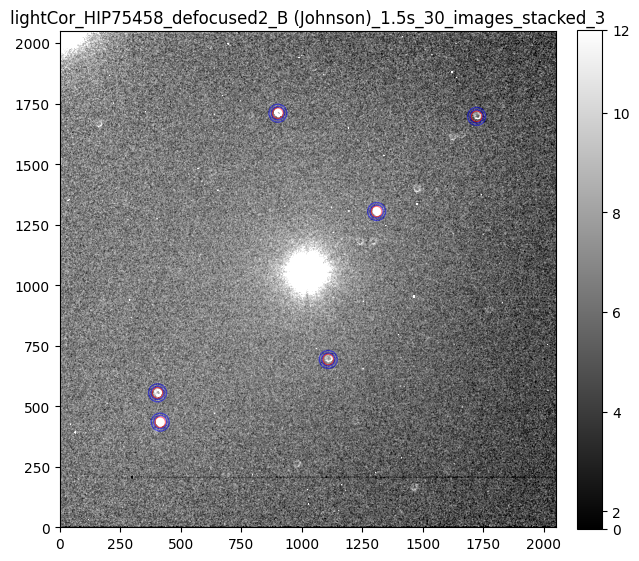

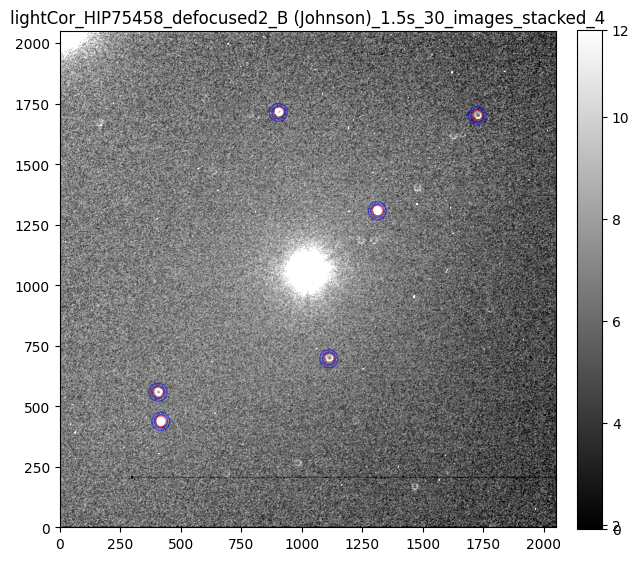

In [52]:
#### todo write function, for mean and median as in ls
radius=22    #change here
top_n=140 #change number of stars here (count from brightest)


'''
#detect positions in reference (focused image) and later shift the positions to the df images
mask2 = np.zeros(focused_image.shape, dtype=bool)
x, y = np.ogrid[:focused_image.shape[1], :focused_image[0].shape[0]]
#circle_mask = np.sqrt((x - pos_br_median[middle][0][0]) ** 2 + (y - pos_br_median[middle][0][1]) ** 2) <= (radius_bright+30)
circle_mask = np.sqrt((x - position_bright_focused[0][0]) ** 2 + (y - position_bright_focused[0][1]) ** 2) <= (radius_bright+30)
mask2[circle_mask] = True

daofind_faint = DAOStarFinder(fwhm=2.0, threshold=5.0*std, roundlo=-5.0, roundhi=5.0) ### change brightest for every series !!!!!!!!!!!!!!!!!
sources_faint = daofind_faint(focused_image, mask=mask2)
sources_faint.sort(['xcentroid', 'ycentroid'])
positions_faint = np.transpose((sources_faint['xcentroid'], sources_faint['ycentroid']))
positions_faint,sources_faint = filter_sources(positions_faint, sources_faint, min_separation=55, min_edge_distance=0) #exclude multiple detections of star, min edge dist not relevant since we will shift pos
print('detected stars in focused image:', len(positions_faint))'''


#or use positions from clicker
positions_faint = [(411, 431), (400, 552), (1105, 690), (897, 1707), (1305, 1301), (1718, 1694)]
#print(len(positions_faint))
shifts_ft = shifts


edge = 30
valid_positions = [pos for pos in positions_faint if all(edge < pos[0] + shift[0] < 2048 - edge and edge < pos[1] + shift[1] < 2048 - edge for shift in shifts_ft)]
print(len(valid_positions))

def get_mag_faint(input_list, plotting = False):
    magnitude_list_faint, positions_faint = [],[]

    for i,image in enumerate (input_list):
        
        shifted_positions = []
        for position in valid_positions:
            tuple = np.array((position[0]+shifts_ft[i][0], position[1]+shifts_ft[i][1]))
            shifted_positions.append(tuple)

        apertures_faint = [CircularAperture(position, r=radius) for position in shifted_positions]
        annulus_apertures_faint = [CircularAnnulus(position,r_in=radius+5, r_out=radius+15) for position in shifted_positions]
        
        # Initialize an empty table to store the photometry results
        phot_table_faint = Table(names=('id', 'xcenter', 'ycenter', 'aperture_sum', 'total_bkg'), dtype=('int', 'float', 'float', 'float', 'float'))
        for j in range(len(apertures_faint)):
            aperstats = ApertureStats(image, annulus_apertures_faint[j])
            bkg = aperstats.median
            aperture_area = apertures_faint[j].area_overlap(image)
            total_bkg = bkg * aperture_area
            phot_table = aperture_photometry(image, apertures_faint[j])
            phot_table['total_bkg'] = total_bkg
            phot_table_faint.add_row([j, phot_table['xcenter'][0], phot_table['ycenter'][0], phot_table['aperture_sum'][0], phot_table['total_bkg'][0]])
        #phot_table_faint.pprint(max_lines = -1, max_width = -1)

        magnitudes=[]
        for row in phot_table_faint:
            magnitude =  - (2.5 * np.log10(abs(row['aperture_sum'] - row['total_bkg']) / exptime))
            magnitudes.append(magnitude)
        

        sorted_indices = np.argsort(magnitudes)[:top_n]
        top_n_magnitudes = [magnitudes[idx] for idx in sorted_indices]
        top_n_positions = [shifted_positions[idx] for idx in sorted_indices]
        apertures_faint = [apertures_faint[idx] for idx in sorted_indices]
        annulus_apertures_faint = [annulus_apertures_faint[idx] for idx in sorted_indices]
        
        magnitude_list_faint.append(top_n_magnitudes)
        positions_faint.append(top_n_positions)

        if plotting == True:
            if i == 0:
                fig, ax = plt.subplots(1, 1, figsize=(12, 12))
            else:
                fig, ax = plt.subplots(1,1, figsize=(7,7))
            show_image(image, fig=fig, ax=ax)
            ax.set_title(titles[i])
            for aperture in apertures_faint:
                aperture.plot(color="red", lw=1.0, alpha=0.5)
            for anulus in annulus_apertures_faint:
                anulus.plot(color="blue", lw=1.0, alpha=0.5)


    mean_faint_magnitudes_list = [np.mean(mag) for mag in magnitude_list_faint] #mean of all refernce stars
    print(mean_faint_magnitudes_list)
    print(np.std(mean_faint_magnitudes_list))
    return positions_faint, magnitude_list_faint, mean_faint_magnitudes_list


pos_ft_mean,    mag_ft_mean,    mean_mag_ft_mean    = get_mag_faint(image_list, plotting = True)
pos_ft_median,  mag_ft_median,  mean_mag_ft_median  = get_mag_faint(image_list_median)

# Diff Phot


In [53]:
def print_results(magnitude_list_bright,mean_faint_magnitudes_list):
  diff_magnitude_list = []
  print("index  bright mag        faint mag         diff mag")
  for index in range (len(image_list)):
    diff_magnitude= magnitude_list_bright[index] - mean_faint_magnitudes_list [index]
    print(index,  magnitude_list_bright[index] , mean_faint_magnitudes_list [index], diff_magnitude)
    diff_magnitude_list.append(diff_magnitude)
  print(f"The differential Magnitude is: M = {round(np.mean(diff_magnitude_list), 4)}err{round(np.std(diff_magnitude_list), 4)} mag")
  print(f"Value for bright star: {round(np.mean(magnitude_list_bright),4)}+-{round(np.std(magnitude_list_bright),4)}")
  print(f"Value for faint stars: {round(np.mean(mean_faint_magnitudes_list),4)}+-{round(np.std(mean_faint_magnitudes_list),4)}")
  
print('for mean:')
print_results(mag_br_mean,  mean_mag_ft_mean)
print('')
print('for median:')
print_results(mag_br_median,  mean_mag_ft_median)


for mean:
index  bright mag        faint mag         diff mag
0 -16.7920802679946 -9.630039540531627 -7.162040727462973
1 -16.789325002179325 -9.630083124084436 -7.159241878094889
2 -16.78622670909295 -9.594327737015723 -7.191898972077228
3 -16.784374118713753 -9.642044636497152 -7.142329482216601
4 -16.783043471173702 -9.624830705646191 -7.1582127655275105
The differential Magnitude is: M = -7.1627err0.0161 mag
Value for bright star: -16.787+-0.0033
Value for faint stars: -9.6243+-0.016

for median:
index  bright mag        faint mag         diff mag
0 -16.780132674999333 -9.61080778172314 -7.169324893276192
1 -16.778185016995216 -9.628991941903577 -7.14919307509164
2 -16.77329557073316 -9.622394447933235 -7.150901122799926
3 -16.774437365343115 -9.632340149958189 -7.142097215384926
4 -16.770040530961477 -9.627399560658356 -7.1426409703031215
The differential Magnitude is: M = -7.1508err0.0099 mag
Value for bright star: -16.7752+-0.0036
Value for faint stars: -9.6244+-0.0075


In [83]:
# for bright position
# no need to do it seperatly for mean and median, because positions are same (and only wcs information for mean)
bright_results = []
empty_column = Column(name='Position Number', data=[None])
x_column = Column(name='x', data=[None])
y_column = Column(name='y', data=[None])

sky = w.pixel_to_world(*pos_br_mean[middle][0]) # for only one image 
print(sky)
star_coords = SkyCoord(ra=sky.ra, dec=sky.dec, frame='icrs', unit=(u.deg, u.deg))

viz = Vizier(columns=['DR3Name', 'RAJ2000', 'DEJ2000', 'BPmag','e_BPmag', 'RPmag', 'e_RPmag', 'Gmag', 'Plx','e_Plx', 'G-RP', 'BP-RP']) # params for gaia: Gmag: phot_g_mean_mag, Plx: parallax [mas], G-RP: Gmag-Rmag
result = viz.query_region(star_coords, radius=10 * u.arcsecond, catalog='I/355 ') #gaia dr3

# Check and select the entry with the lowest magnitude
if result is not None and len(result) > 0:
    min_mag_idx = None
    min_mag = float('inf')

    # Find the entry with the lowest magnitude
    for idx, row in enumerate(result[0]):
        if row['BPmag'] < min_mag:
            min_mag = row['BPmag']
            min_mag_idx = idx
        if row['RPmag'] < min_mag:
            min_mag = row['RPmag']
            min_mag_idx = idx

    # If a minimum magnitude entry is found, update the values
    if min_mag_idx is not None:
        # Use .copy() to avoid modifying the original columns
        result[0]['Position Number'] = empty_column.copy()
        result[0]['x'] = x_column.copy()
        result[0]['y'] = y_column.copy()
        # Update the values for the current iteration
        result[0]['Position Number'][min_mag_idx] = len(pos_ft_mean[0])+1 #give it the last number, because we will combine with faint list
        result[0]['x'][min_mag_idx] = pos_br_mean[middle][0][0]
        result[0]['y'][min_mag_idx] = pos_br_mean[middle][0][1]

        bright_results.append(result[0][min_mag_idx])

print(bright_results)

<SkyCoord (FK5: equinox=2000.0): (ra, dec) in deg
    (305.96471625, 32.19031745)>
[<Row index=1>
          DR3Name                RAJ2000         DEJ2000       BPmag    e_BPmag    RPmag    e_RPmag     Gmag      Plx     e_Plx     G-RP     BP-RP   Position Number         x                y        
                                   deg             deg          mag       mag       mag       mag       mag       mas      mas      mag       mag                                                      
           str28                 float64         float64      float64   float64   float64   float64   float64   float64  float32  float64   float64       object           object           object     
---------------------------- --------------- --------------- --------- --------- --------- --------- --------- --------- ------- --------- --------- --------------- ----------------- ----------------
Gaia DR3 1862193748217511040 305.96505748925  32.19013378977  4.689272  0.003562  3.181613  0.004281  

In [85]:
# for faint position 
# here no need to it seperatly too
all_results = []
empty_column = Column(name='Position Number', data=[None])
x_column = Column(name='x', data=[None])
y_column = Column(name='y', data=[None])

for i, position in enumerate(pos_ft_mean[middle]):
    sky = w.pixel_to_world(*position)
    star_coords = SkyCoord(ra=sky.ra, dec=sky.dec, frame='icrs', unit=(u.deg, u.deg))

    viz = Vizier(columns=['DR3Name', 'RAJ2000', 'DEJ2000', 'BPmag','e_BPmag', 'RPmag', 'e_RPmag', 'Gmag', 'Plx','e_Plx', 'G-RP', 'BP-RP']) # params for gaia
    result = viz.query_region(star_coords, radius= 8.0 * u.arcsecond, catalog='I/355 ') #gaia dr3

    # Check and select the entry with the lowest magnitude
    if result is not None and len(result) > 0:
        min_mag_idx = None
        min_mag = float('inf')

        # Find the entry with the lowest magnitude
        for idx, row in enumerate(result[0]):
            if row['BPmag'] < min_mag:
                min_mag = row['BPmag']
                min_mag_idx = idx
            if row['RPmag'] < min_mag:
                min_mag = row['RPmag']
                min_mag_idx = idx

        # If a minimum magnitude entry is found, update the values
        if min_mag_idx is not None:
            # Use .copy() to avoid modifying the original columns
            result[0]['Position Number'] = empty_column.copy()
            result[0]['x'] = x_column.copy()
            result[0]['y'] = y_column.copy()
            # Update the values for the current iteration
            result[0]['Position Number'][min_mag_idx] = i + 1
            result[0]['x'][min_mag_idx] = position[0]
            result[0]['y'][min_mag_idx] = position[1]

            all_results.append(result[0][min_mag_idx])

print(len(all_results))

140


In [86]:
final_table_gaia = vstack(all_results + bright_results)
df = final_table_gaia.to_pandas()
display(df)

,DR3Name,RAJ2000,DEJ2000,BPmag,e_BPmag,RPmag,e_RPmag,Gmag,Plx,e_Plx,G-RP,BP-RP,Position Number,x,y
0,Gaia DR3 1862199005254756736,306.139069,32.207997,9.239444,0.002806,8.508635,0.003789,8.957806,7.6569,0.0132,0.449171,0.730809,1,1806.90953,1041.913455
1,Gaia DR3 1862190861985484800,306.013421,32.092404,9.214108,0.002835,8.747530,0.003869,9.135907,4.3259,0.0354,0.388377,0.466578,2,1229.834134,410.4389
2,Gaia DR3 1862097639709884928,305.840992,32.066135,9.359471,0.002806,8.217300,0.003795,8.869079,2.0784,0.0152,0.651778,1.142171,3,434.336004,263.880996
3,Gaia DR3 1862189418887387136,306.094658,32.115188,9.484606,0.002824,7.999590,0.003793,8.797172,2.1007,0.0144,0.797582,1.485016,4,1603.498409,535.252702
4,Gaia DR3 2054351306571429888,305.801117,32.299600,20.576445,0.099931,18.347624,0.020475,19.410805,0.9074,0.2713,1.063181,2.228821,5,268.538273,1545.267879
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
136,Gaia DR3 2054356185655215488,306.118673,32.380543,21.198658,0.109999,18.864060,0.029199,19.922950,-0.1264,0.3840,1.058891,2.334598,137,1704.171017,1969.564045
137,Gaia DR3 2054348729606747264,305.893072,32.257542,18.179360,0.009973,15.524533,0.004647,16.709717,0.1057,0.0500,1.185183,2.654826,138,669.846043,1313.460203
138,Gaia DR3 2054355532818976000,305.993091,32.381647,17.921658,0.008353,16.017840,0.004392,16.986658,0.4668,0.0543,0.968819,1.903818,139,1130.712622,1969.602753
139,Gaia DR3 2054351856342968192,305.874309,32.302468,14.885002,0.002956,13.904660,0.003840,14.478254,1.5957,0.0162,0.573594,0.980342,140,584.418958,1550.320655


In [54]:
#combine the faint and bright magnitudes (for saving them into table later)
mag_all_mean    = [ft + [br] for ft, br in zip(mag_ft_mean, mag_br_mean)]
mag_all_median  = [ft + [br] for ft, br in zip(mag_ft_median, mag_br_median)]

print(mag_all_mean[0][-1])
print(len(mag_all_mean[0]))

-16.7920802679946
7


In [55]:
'''df = pd.DataFrame({
    f'Mag_Mean_Im_{i+1}': mag_list_mean for i, mag_list_mean in enumerate(mag_all_mean)
})

# Adding columns from mag_all_median to the DataFrame
df = pd.concat([
    df,
    pd.DataFrame({
        f'Mag_Median_Im_{i+1}': mag_list_median for i, mag_list_median in enumerate(mag_all_median)
    })
], axis=1)

all_pos = pos_ft_median[middle] + pos_br_median[middle]
print(all_pos)
x_values = [pos[0] for pos in all_pos]
y_values = [pos[1] for pos in all_pos]
df['x'] = x_values
df['y'] = y_values

# Display the created DataFrame
display(df)'''

[array([411, 431]), array([1305, 1301]), array([ 897, 1707]), array([400, 552]), array([1718, 1694]), array([1105,  690]), [1016, 1051]]


,Mag_Mean_Im_1,Mag_Mean_Im_2,Mag_Mean_Im_3,Mag_Mean_Im_4,Mag_Mean_Im_5,Mag_Median_Im_1,Mag_Median_Im_2,Mag_Median_Im_3,Mag_Median_Im_4,Mag_Median_Im_5,x,y
0,-11.282603,-11.273139,-11.281592,-11.274507,-11.272646,-11.280247,-11.267766,-11.273565,-11.268494,-11.271573,411,431
1,-11.032898,-11.029154,-11.026545,-11.035935,-11.023227,-11.027172,-11.022876,-11.024715,-11.031328,-11.016946,1305,1301
2,-9.882918,-9.839304,-9.814911,-9.811886,-9.839514,-9.859308,-9.841535,-9.816148,-9.815290,-9.832688,897,1707
3,-8.910170,-8.902593,-8.859388,-8.919693,-8.896504,-8.898205,-8.880805,-8.917542,-8.914623,-8.952518,400,552
4,-8.346567,-8.394817,-8.306382,-8.450701,-8.442142,-8.326355,-8.398656,-8.384426,-8.441939,-8.438464,1718,1694
5,-8.325081,-8.341493,-8.277148,-8.359546,-8.274951,-8.273560,-8.362313,-8.317971,-8.322367,-8.252208,1105,690
6,-16.792080,-16.789325,-16.786227,-16.784374,-16.783043,-16.780133,-16.778185,-16.773296,-16.774437,-16.770041,1016,1051


In [88]:
#only save the magnitudes from the positions which are solved with gaia data
valid_positions = df['Position Number'].to_list()
print('valid positions: ',valid_positions)

valid_mag_mean   = []
valid_mag_median = []
for i in range (len(mag_all_mean)):
    m1=[]
    m2=[]
    for index in valid_positions:
        m1.append(mag_all_mean[i][index-1])
        m2.append(mag_all_median[i][index-1])
    valid_mag_mean.append(m1)
    valid_mag_median.append(m2)

print(valid_positions)
print(mag_all_median)
print(valid_mag_median)

for i, mag_list in enumerate(valid_mag_mean):
    col_name = f'Mag_Mean_Im_{i+1}'  # create coloumn for each image
    df = df.assign(**{col_name: mag_list})  # Add magnitudes for the current image to the DataFrame

for i, mag_list in enumerate(valid_mag_median):
    col_name = f'Mag_Median_Im_{i+1}'  # create coloumn for each image
    df = df.assign(**{col_name: mag_list}) 

display(df)

valid positions:  [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141]
[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 

,DR3Name,RAJ2000,DEJ2000,BPmag,e_BPmag,RPmag,e_RPmag,Gmag,Plx,e_Plx,...,Mag_Mean_Im_7,Mag_Mean_Im_8,Mag_Median_Im_1,Mag_Median_Im_2,Mag_Median_Im_3,Mag_Median_Im_4,Mag_Median_Im_5,Mag_Median_Im_6,Mag_Median_Im_7,Mag_Median_Im_8
0,Gaia DR3 1862199005254756736,306.139069,32.207997,9.239444,0.002806,8.508635,0.003789,8.957806,7.6569,0.0132,...,-11.833771,-11.833231,-11.834231,-11.826331,-11.825561,-11.828982,-11.830969,-11.830926,-11.827540,-11.826784
1,Gaia DR3 1862190861985484800,306.013421,32.092404,9.214108,0.002835,8.747530,0.003869,9.135907,4.3259,0.0354,...,-11.669404,-11.665547,-11.657542,-11.656014,-11.660353,-11.662132,-11.659997,-11.655827,-11.659867,-11.656539
2,Gaia DR3 1862097639709884928,305.840992,32.066135,9.359471,0.002806,8.217300,0.003795,8.869079,2.0784,0.0152,...,-11.167370,-11.164131,-11.160574,-11.158725,-11.155806,-11.163944,-11.162926,-11.159650,-11.158820,-11.154221
3,Gaia DR3 1862189418887387136,306.094658,32.115188,9.484606,0.002824,7.999590,0.003793,8.797172,2.1007,0.0144,...,-10.711498,-10.711672,-10.693260,-10.683522,-10.689855,-10.696781,-10.697836,-10.695346,-10.703172,-10.703390
4,Gaia DR3 2054351306571429888,305.801117,32.299600,20.576445,0.099931,18.347624,0.020475,19.410805,0.9074,0.2713,...,-10.456805,-10.459585,-10.463470,-10.469995,-10.465502,-10.458529,-10.457878,-10.449749,-10.450242,-10.452532
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
136,Gaia DR3 2054356185655215488,306.118673,32.380543,21.198658,0.109999,18.864060,0.029199,19.922950,-0.1264,0.3840,...,-5.089393,-5.017696,-4.877973,-4.949205,-5.019059,-5.017622,-5.026001,-5.059930,-4.960730,-4.989299
137,Gaia DR3 2054348729606747264,305.893072,32.257542,18.179360,0.009973,15.524533,0.004647,16.709717,0.1057,0.0500,...,-4.932941,-4.968281,-4.865413,-4.942334,-4.961250,-5.013388,-5.019377,-4.996165,-4.946727,-4.929032
138,Gaia DR3 2054355532818976000,305.993091,32.381647,17.921658,0.008353,16.017840,0.004392,16.986658,0.4668,0.0543,...,-4.917249,-4.925651,-4.842343,-4.866691,-4.948182,-5.010848,-5.015426,-4.963414,-4.934720,-4.922542
139,Gaia DR3 2054351856342968192,305.874309,32.302468,14.885002,0.002956,13.904660,0.003840,14.478254,1.5957,0.0162,...,-4.889659,-4.901803,-4.823375,-4.853961,-4.923226,-4.962588,-4.962092,-4.960365,-4.891385,-4.884390


In [56]:
output_path = path[:46] + 'results'
if not os.path.exists(output_path):
    os.makedirs(output_path)

In [40]:
time_list =[]
for i in range (len(header_list)):
    print(header_list[i]['DATE-OBS'])
    time_list.append(header_list[i]['DATE-OBS']

#file_name = f'time_list_{header_list[0]["DATE-OBS"][:10]}_df_{header_list[0]["OBJECT"]}_{header_list[0]["FILTER"]}_{exptime}s.txt'
file_name = f'time_list_{header_list[0]["DATE-OBS"][:10]}_df_{header_list[0]["OBJECT"]}_{header_list[0]["FILTER"]}_{exptime}s.txt'
file_path = os.path.join(output_path, file_name) 
with open(file_path, 'w') as file:
    for item in time_list:
        file.write(f"{item}\n")

2023-09-30T18:54:48
2023-09-30T19:00:13
2023-09-30T19:05:39
2023-09-30T19:11:02
2023-09-30T19:16:24


FileNotFoundError: [Errno 2] No such file or directory: '/home/finn/visual_Studio_Code/data/2023-09-30/results/time_list_2023-09-30_df_Iota Dra/12 Dra_B (Johnson)_3.0s.txt'

In [57]:
#save to csv file
#file_name = 'results_' + f'{header_list[0]["DATE-OBS"][:10]}_df_{header_list[0]["OBJECT"]}_{header_list[0]["FILTER"]}_{exptime}s.csv'
file_name = 'results_' + f'{header_list[0]["DATE-OBS"][:10]}_df_{header_list[0]["OBJECT"]}_{header_list[0]["FILTER"]}_{exptime}s_30stacked.csv'
file_path = os.path.join(output_path, file_name) #output path defined above
df.to_csv(file_path)

# Old try with function


In [37]:
'''
import numpy as np
from astropy.stats import sigma_clipped_stats
from astropy.stats import mad_std
from photutils import CircularAperture, CircularAnnulus, aperture_photometry, ApertureStats
from astropy.table import Table


def determine_magnitudes(image, positions, star_radius, exptime):
  #for bright star
  if len(positions) == 1:
    aperture = CircularAperture(positions, r=star_radius)
    annulus_aperture = CircularAnnulus(positions, r_in=star_radius+15, r_out=star_radius+45)
    aperture.plot(color='red', lw=1.0, alpha=0.5);
    annulus_aperture.plot(color="blue", lw=1.0, alpha=0.5);
    phot_table = aperture_photometry(image, aperture, method='subpixel', subpixels=5)
    aperstats = ApertureStats(image, annulus_aperture)
    bkg = aperstats.median
    aperture_area = aperture.area_overlap(image)
    total_bkg = bkg * aperture_area
    phot_table['total_bkg'] = total_bkg
    for line in phot_table:
      magnitudes = - (2.5*np.log10(abs(line[3]-line[4])/exptime)) #here single value

  else:
    apertures = [CircularAperture(position, r=star_radius) for position in positions]
    annulus_apertures = [CircularAnnulus(position,r_in=star_radius+5, r_out=star_radius+15) for position in shifted_positions]
    for aperture in apertures:
        aperture.plot(color="red", lw=1.0, alpha=0.5)
    for anulus in annulus_apertures:
        anulus.plot(color="blue", lw=1.0, alpha=0.5)
    phot_table_faint = Table(names=('id', 'xcenter', 'ycenter', 'aperture_sum', 'total_bkg'), dtype=('int', 'float', 'float', 'float', 'float'))
    for j in range(len(apertures)):
        aperstats = ApertureStats(image, annulus_apertures[j])
        bkg = aperstats.median
        aperture_area = apertures[j].area_overlap(image)
        total_bkg = bkg * aperture_area
        phot_table = aperture_photometry(image, apertures[j])
        phot_table['total_bkg'] = total_bkg
        phot_table_faint.add_row([j, phot_table['xcenter'][0], phot_table['ycenter'][0], phot_table['aperture_sum'][0], phot_table['total_bkg'][0]])
    magnitudes=[]
    for row in phot_table_faint:
        magnitude =  - (2.5 * np.log10(abs(row['aperture_sum'] - row['total_bkg']) / exptime))
        magnitudes.append(magnitude) #magnitudes here list
  return magnitudes
  '''

'\nimport numpy as np\nfrom astropy.stats import sigma_clipped_stats\nfrom astropy.stats import mad_std\nfrom photutils import CircularAperture, CircularAnnulus, aperture_photometry, ApertureStats\nfrom astropy.table import Table\n\n\ndef determine_magnitudes(image, positions, star_radius, exptime):\n  #for bright star\n  if len(positions) == 1:\n    aperture = CircularAperture(positions, r=star_radius)\n    annulus_aperture = CircularAnnulus(positions, r_in=star_radius+15, r_out=star_radius+45)\n    aperture.plot(color=\'red\', lw=1.0, alpha=0.5);\n    annulus_aperture.plot(color="blue", lw=1.0, alpha=0.5);\n    phot_table = aperture_photometry(image, aperture, method=\'subpixel\', subpixels=5)\n    aperstats = ApertureStats(image, annulus_aperture)\n    bkg = aperstats.median\n    aperture_area = aperture.area_overlap(image)\n    total_bkg = bkg * aperture_area\n    phot_table[\'total_bkg\'] = total_bkg\n    for line in phot_table:\n      magnitudes = - (2.5*np.log10(abs(line[3]-line

In [38]:
'''
mask2 = np.zeros(focused_image.shape, dtype=bool)
x, y = np.ogrid[:focused_image.shape[1], :focused_image[0].shape[0]]
circle_mask = np.sqrt((x - position_bright_focused[0][0]) ** 2 + (y - position_bright_focused[0][1]) ** 2) <= (radius_bright+30)
mask2[circle_mask] = True

daofind_faint = DAOStarFinder(fwhm=3.0, threshold=5.0*std, roundlo=-5.0, roundhi=5.0, brightest=40) #roundlo and roundhi to adjust detection shape. need to be calibrated
sources_faint = daofind_faint(focused_image, mask=mask2)
sources_faint.sort(['xcentroid', 'ycentroid'])
positions_faint = np.transpose((sources_faint['xcentroid'], sources_faint['ycentroid']))
positions_faint,sources_faint = filter_sources(positions_faint, sources_faint, min_separation=40, min_edge_distance=60) #exclude multiple detections of star
print('detected stars in focused image:', len(positions_faint))

magnitudes_list_faint = []
mean_magnitudes_list_faint=[]

for i,image in enumerate (image_list):
    fig, ax = plt.subplots(1, 1, figsize=(10, 10))
    show_image(image, fig=fig, ax=ax)
    ax.set_title(titles[i])
    shifted_positions = []
    for position in positions_faint:
        tuple = np.array((position[0]+shifts[i][0], position[1]+shifts[i][1]))
        if 50 < tuple[0] < 2000 and 50 < tuple[1] < 2000: #use -50 of image size because later images shifting more
          shifted_positions.append(tuple)

    print('the valid shifted positions:', len(shifted_positions))
    magnitudes = determine_magnitudes(image, positions=shifted_positions, star_radius=16, exptime=exptime)
    magnitudes_list_faint.append(magnitudes)

mean_magnitudes_list_faint = [np.mean(mag) for mag in magnitudes_list_faint]

print("mag=", np.mean(mean_magnitudes_list_faint),"+-",np.std(mean_magnitudes_list_faint))
'''

'\nmask2 = np.zeros(focused_image.shape, dtype=bool)\nx, y = np.ogrid[:focused_image.shape[1], :focused_image[0].shape[0]]\ncircle_mask = np.sqrt((x - position_bright_focused[0][0]) ** 2 + (y - position_bright_focused[0][1]) ** 2) <= (radius_bright+30)\nmask2[circle_mask] = True\n\ndaofind_faint = DAOStarFinder(fwhm=3.0, threshold=5.0*std, roundlo=-5.0, roundhi=5.0, brightest=40) #roundlo and roundhi to adjust detection shape. need to be calibrated\nsources_faint = daofind_faint(focused_image, mask=mask2)\nsources_faint.sort([\'xcentroid\', \'ycentroid\'])\npositions_faint = np.transpose((sources_faint[\'xcentroid\'], sources_faint[\'ycentroid\']))\npositions_faint,sources_faint = filter_sources(positions_faint, sources_faint, min_separation=40, min_edge_distance=60) #exclude multiple detections of star\nprint(\'detected stars in focused image:\', len(positions_faint))\n\nmagnitudes_list_faint = []\nmean_magnitudes_list_faint=[]\n\nfor i,image in enumerate (image_list):\n    fig, ax = 

In [39]:
"""
mask = np.zeros(image_list[0].shape, dtype=bool)
mask[1900:2048, 0:200] = True

magnitude_list_bright = []
position_list_bright = []

for index, image in enumerate(image_list):
    mean, median, std = sigma_clipped_stats(image, sigma=3.0)
    #print((mean, median, std))
    daofind = DAOStarFinder(fwhm=3.0, threshold=5.0*std, roundlo=-1.0, roundhi=1.0,brightest=1) #roundlo and roundhi to adjust detection shape. need to be
    sources = daofind(image, mask=mask)
    positions = np.transpose((sources['xcentroid'], sources['ycentroid']))
    positions,sources = filter_sources(positions, sources, 20)
    position_list_bright.extend(positions)
    fig, ax = plt.subplots(1,1, figsize= (10,10))
    show_image(image,fig=fig, ax=ax)
    ax.set_title(titles[index])
    magnitude_bright = determine_magnitudes(image, positions, star_radius=80, exptime=exptime)
    magnitude_list_bright.append(magnitude_bright)

print('positions of bright star: ',position_list_bright)
print(np.std(magnitude_list_bright))
print(magnitude_list_bright)
"""

"\nmask = np.zeros(image_list[0].shape, dtype=bool)\nmask[1900:2048, 0:200] = True\n\nmagnitude_list_bright = []\nposition_list_bright = []\n\nfor index, image in enumerate(image_list):\n    mean, median, std = sigma_clipped_stats(image, sigma=3.0)\n    #print((mean, median, std))\n    daofind = DAOStarFinder(fwhm=3.0, threshold=5.0*std, roundlo=-1.0, roundhi=1.0,brightest=1) #roundlo and roundhi to adjust detection shape. need to be\n    sources = daofind(image, mask=mask)\n    positions = np.transpose((sources['xcentroid'], sources['ycentroid']))\n    positions,sources = filter_sources(positions, sources, 20)\n    position_list_bright.extend(positions)\n    fig, ax = plt.subplots(1,1, figsize= (10,10))\n    show_image(image,fig=fig, ax=ax)\n    ax.set_title(titles[index])\n    magnitude_bright = determine_magnitudes(image, positions, star_radius=80, exptime=exptime)\n    magnitude_list_bright.append(magnitude_bright)\n\nprint('positions of bright star: ',position_list_bright)\nprint(

In [40]:
# 1.1. Bright star (old)

'''
mask = np.zeros(image_list[0].shape, dtype=bool)
mask[1900:2048, 0:200] = True

magnitude_list_bright = []
position_list_bright = []

for index, image in enumerate(image_list):
    mean, median, std = sigma_clipped_stats(image, sigma=3.0)
    #print((mean, median, std))
    daofind = DAOStarFinder(fwhm=3.0, threshold=5.0*std, roundlo=-1.0, roundhi=1.0,brightest=1) #roundlo and roundhi to adjust detection shape. need to be
    sources = daofind(image, mask=mask)
    positions = np.transpose((sources['xcentroid'], sources['ycentroid']))
    positions,sources = filter_sources(positions, sources, 20)
    position_list_bright.extend(positions)

    radius_bright = 80
    aperture_bright = CircularAperture(positions, r=radius_bright)
    annulus_aperture_bright = CircularAnnulus(positions, r_in=radius_bright+15, r_out=radius_bright+40)
    if index == 0:
      fig, ax = plt.subplots(1,1, figsize= (10,10))
    else:
       fig, ax = plt.subplots(1,1, figsize= (6,6))
    show_image(image,fig=fig, ax=ax)
    ax.set_title(titles[index])
    aperture_bright.plot(color='red', lw=1.0, alpha=0.5);
    annulus_aperture_bright.plot(color="blue", lw=1.0, alpha=0.5);

    phot_table_bright = aperture_photometry(image, aperture_bright, method='subpixel', subpixels=5)
    aperstats = ApertureStats(image, annulus_aperture_bright)
    bkg = aperstats.median
    aperture_area = aperture_bright.area_overlap(image)
    total_bkg = bkg * aperture_area
    phot_table_bright['total_bkg'] = total_bkg

    for line in phot_table_bright:
      magnitude_bright = - (2.5*np.log10(abs(line[3]-line[4])/exptime)) #M = zeropoint - 2.5*log10((flux-background)/exptime)
    #phot_table_bright['magnitude'] = magnitude_bright
    #phot_table_bright.pprint(max_lines = -1, max_width = -1)
    magnitude_list_bright.append(magnitude_bright)
print('positions of bright star: ',position_list_bright)

print(np.std(magnitude_list_bright))
'''

'\nmask = np.zeros(image_list[0].shape, dtype=bool)\nmask[1900:2048, 0:200] = True\n\nmagnitude_list_bright = []\nposition_list_bright = []\n\nfor index, image in enumerate(image_list):\n    mean, median, std = sigma_clipped_stats(image, sigma=3.0)\n    #print((mean, median, std))\n    daofind = DAOStarFinder(fwhm=3.0, threshold=5.0*std, roundlo=-1.0, roundhi=1.0,brightest=1) #roundlo and roundhi to adjust detection shape. need to be\n    sources = daofind(image, mask=mask)\n    positions = np.transpose((sources[\'xcentroid\'], sources[\'ycentroid\']))\n    positions,sources = filter_sources(positions, sources, 20)\n    position_list_bright.extend(positions)\n\n    radius_bright = 80\n    aperture_bright = CircularAperture(positions, r=radius_bright)\n    annulus_aperture_bright = CircularAnnulus(positions, r_in=radius_bright+15, r_out=radius_bright+40)\n    if index == 0:\n      fig, ax = plt.subplots(1,1, figsize= (10,10))\n    else:\n       fig, ax = plt.subplots(1,1, figsize= (6,6)

In [41]:
# 1.2 Bright star (method: determine position by hand and use shifts)

'''
shifts_bright = determine_shift(image_list, wanted_index=0)
print(shifts_bright)

magnitude_list_bright = []

valid_positions= [position_list_bright[0]] # define positon per hand

for i,image in enumerate (image_list):
    fig, ax = plt.subplots(1, 1, figsize=(10, 10))
    show_image(image, fig=fig, ax=ax)
    ax.set_title(titles[i])
    shifted_positions = []
    for position in valid_positions:
        tuple = np.array((position[0]+shifts_bright[i][0], position[1]+shifts_bright[i][1]))
        shifted_positions.append(tuple)

    radius_bright = 80
    aperture_bright = CircularAperture(shifted_positions, r=radius_bright)
    annulus_aperture_bright = CircularAnnulus(shifted_positions, r_in=radius_bright+15, r_out=radius_bright+45)
    aperture_bright.plot(color='red', lw=1.0, alpha=0.5);
    annulus_aperture_bright.plot(color="blue", lw=1.0, alpha=0.5);

    phot_table_bright = aperture_photometry(image, aperture_bright, method='subpixel', subpixels=5)
    aperstats = ApertureStats(image, annulus_aperture_bright)
    bkg = aperstats.median
    aperture_area = aperture_bright.area_overlap(image)
    total_bkg = bkg * aperture_area
    phot_table_bright['total_bkg'] = total_bkg

    for line in phot_table_bright:
      magnitude_bright = - (2.5*np.log10(abs(line[3]-line[4])/exptime)) #M = zeropoint - 2.5*log10((flux-background)/exptime)
    #phot_table_bright['magnitude'] = magnitude_bright
    #phot_table_bright.pprint(max_lines = -1, max_width = -1)
    magnitude_list_bright.append(magnitude_bright)

print(np.std(magnitude_list_bright))
'''

'\nshifts_bright = determine_shift(image_list, wanted_index=0)\nprint(shifts_bright)\n\nmagnitude_list_bright = []\n\nvalid_positions= [position_list_bright[0]] # define positon per hand\n\nfor i,image in enumerate (image_list):\n    fig, ax = plt.subplots(1, 1, figsize=(10, 10))\n    show_image(image, fig=fig, ax=ax)\n    ax.set_title(titles[i])\n    shifted_positions = []\n    for position in valid_positions:\n        tuple = np.array((position[0]+shifts_bright[i][0], position[1]+shifts_bright[i][1]))\n        shifted_positions.append(tuple)\n\n    radius_bright = 80\n    aperture_bright = CircularAperture(shifted_positions, r=radius_bright)\n    annulus_aperture_bright = CircularAnnulus(shifted_positions, r_in=radius_bright+15, r_out=radius_bright+45)\n    aperture_bright.plot(color=\'red\', lw=1.0, alpha=0.5);\n    annulus_aperture_bright.plot(color="blue", lw=1.0, alpha=0.5);\n\n    phot_table_bright = aperture_photometry(image, aperture_bright, method=\'subpixel\', subpixels=5)\n

In [42]:
# function to determine individual radii
'''
def determine_distance(data, positions,max_value=30):
    valid_positions = []
    distance_list = []
    if len(positions) == 2: # if only one source
      x_values = [int(positions[0])]
      y_values = [int(positions[1])]
    else:
      x_values = [int(value[0]) for value in positions]
      y_values = [int(value[1]) for value in positions]

    #fig, ax = plt.subplots(len(positions), 1, figsize=(8, 6 * len(positions)))
    for i in range(len(x_values)):
        size = 40
        if x_values[i] < size or x_values[i] >= data.shape[1] - size:
            row_values = data[y_values[i], x_values[i] - x_values[i]: x_values[i] + x_values[i]]
        else:
            row_values = data[y_values[i], x_values[i] - size: x_values[i] + size]
        x_coordinates = range(len(row_values))
        row_values_bkg = row_values + np.median(row_values)  # add median as background
        peaks, _ = signal.find_peaks(row_values, distance=5)
        peak_values = [(row_values[peak], peak) for peak in peaks]
        sorted_peak_values = sorted(peak_values, reverse=True)
        top_two_values = sorted_peak_values[:2] #(y1,x1),(y2,x2)
        print(top_two_values)
        distance = np.abs(top_two_values[0][1]- top_two_values[1][1])
        #ax[i].plot(x_coordinates, row_values)
        #ax[i].scatter(top_two_values[0][1], top_two_values[0][0])
        #ax[i].scatter(top_two_values[1][1], top_two_values[1][0])
        if distance <= max_value and distance > 0:
            distance_list.append(distance)
            if len(positions) == 2:
                valid_positions.append(positions)
            else:
                valid_positions.append(positions[i])

    return distance_list, valid_positions
'''

'''
def filter_sources(positions, sources, min_separation=30.0, min_edge_distance=50.0):
    distances = cdist(positions, positions)
    edge_distance_x = np.minimum(positions[:, 0], 2048 - positions[:, 0])
    edge_distance_y = np.minimum(positions[:, 1], 2048 - positions[:, 1])
    keep_sources = np.ones(len(positions), dtype=bool)

    for i in range(len(positions)):
        if keep_sources[i]:
            # Find all detections within the minimum separation
            close_indices = np.where(distances[i] < min_separation)[0]

            if len(close_indices) > 1 and edge_distance_x[i] > min_edge_distance and edge_distance_y[i] > min_edge_distance:
                # Calculate the centroid of the close detections
                centroid_x = np.mean(positions[close_indices, 0])
                centroid_y = np.mean(positions[close_indices, 1])

                # Calculate distances from close detections to centroid
                distances_to_centroid = np.sqrt((positions[close_indices, 0] - centroid_x)**2 + (positions[close_indices, 1] - centroid_y)**2)

                # Find the index of the source closest to the centroid
                closest_index = close_indices[np.argmin(distances_to_centroid)]

                # Mark all close detections for removal except the closest one
                keep_sources[close_indices] = False
                keep_sources[closest_index] = True

            if edge_distance_x[i] < min_edge_distance or edge_distance_y[i] < min_edge_distance:
                keep_sources[i] = False

    filtered_positions = positions[keep_sources]
    filtered_sources = sources[keep_sources]

    return filtered_positions, filtered_sources
'''

'\ndef filter_sources(positions, sources, min_separation=30.0, min_edge_distance=50.0):\n    distances = cdist(positions, positions)\n    edge_distance_x = np.minimum(positions[:, 0], 2048 - positions[:, 0])\n    edge_distance_y = np.minimum(positions[:, 1], 2048 - positions[:, 1])\n    keep_sources = np.ones(len(positions), dtype=bool)\n\n    for i in range(len(positions)):\n        if keep_sources[i]:\n            # Find all detections within the minimum separation\n            close_indices = np.where(distances[i] < min_separation)[0]\n\n            if len(close_indices) > 1 and edge_distance_x[i] > min_edge_distance and edge_distance_y[i] > min_edge_distance:\n                # Calculate the centroid of the close detections\n                centroid_x = np.mean(positions[close_indices, 0])\n                centroid_y = np.mean(positions[close_indices, 1])\n\n                # Calculate distances from close detections to centroid\n                distances_to_centroid = np.sqrt((pos